In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img
from skimage import io, img_as_float
from skimage.filters import gaussian
from PIL import Image, ImageEnhance

In [ ]:
os.mkdir('train_class_CLAHE')
os.mkdir('val_class_CLAHE')

In [ ]:
emo_classes = ['neutral','happy','sad','surprise','fear','disgust','anger','contempt']
train_src = "/content/drive/MyDrive/AffectNetCategorized/train_class"
train_dst = "./train_class_CLAHE"
val_src = "/content/drive/MyDrive/AffectNetCategorized/val_class"
val_dst = "./val_class_CLAHE"

In [ ]:
for emotion in emo_classes:
    new_train_src = os.path.join(train_src, emotion)
    new_train_dst = os.path.join(train_dst, emotion)
    os.mkdir(f'train_class_CLAHE/{emotion}')
    for img in os.listdir(new_train_src):
        src = os.path.join(new_train_src, img)
        dst = os.path.join(new_train_dst, img)
        img_ = cv2.imread(src, 1)
        lab_img= cv2.cvtColor(img_, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab_img)
        equ = cv2.equalizeHist(l)
        updated_lab_img1 = cv2.merge((equ,a,b))
        hist_eq_img = cv2.cvtColor(updated_lab_img1, cv2.COLOR_LAB2BGR)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        clahe_img = clahe.apply(l)
        updated_lab_img2 = cv2.merge((clahe_img,a,b))
        CLAHE_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)
        cv2.imwrite(dst, CLAHE_img)
    new_val_src = os.path.join(val_src, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    os.mkdir(f'val_class_CLAHE/{emotion}') 
    for img in os.listdir(new_val_src):
        src = os.path.join(new_val_src, img)
        dst = os.path.join(new_val_dst, img)
        img_ = cv2.imread(src, 1)
        lab_img= cv2.cvtColor(img_, cv2.COLOR_BGR2LAB)
        l, a, b = cv2.split(lab_img)
        equ = cv2.equalizeHist(l)
        updated_lab_img1 = cv2.merge((equ,a,b))
        hist_eq_img = cv2.cvtColor(updated_lab_img1, cv2.COLOR_LAB2BGR)
        clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
        clahe_img = clahe.apply(l)
        updated_lab_img2 = cv2.merge((clahe_img,a,b))
        CLAHE_img = cv2.cvtColor(updated_lab_img2, cv2.COLOR_LAB2BGR)
        cv2.imwrite(dst, CLAHE_img)

In [ ]:
# !zip -r train_class.zip ./train_class_CLAHE
# !zip -r val_class.zip ./val_class_CLAHE

In [ ]:
# shutil.rmtree("val_class_CLAHE", ignore_errors=False, onerror=None)
# shutil.rmtree("train_class_CLAHE", ignore_errors=False, onerror=None)

In [ ]:
train_paths = {}
val_paths ={}
for emotion in emo_classes:
    new_train_dst = os.path.join(train_dst, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    train_paths[emotion] = new_train_dst
    val_paths[emotion] = new_val_dst

NEUTRAL


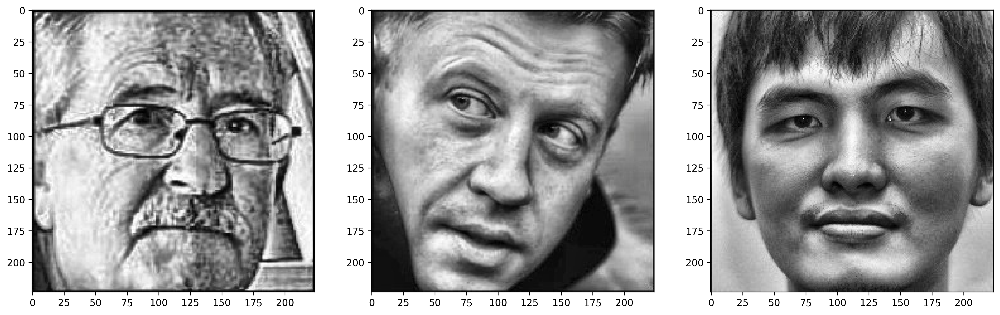

HAPPY


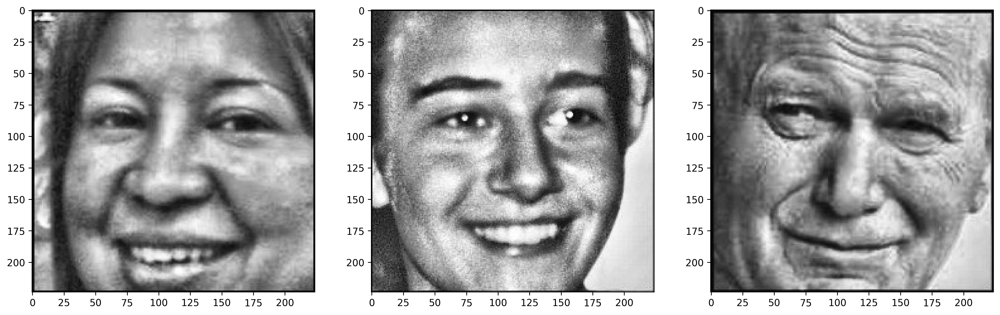

SAD


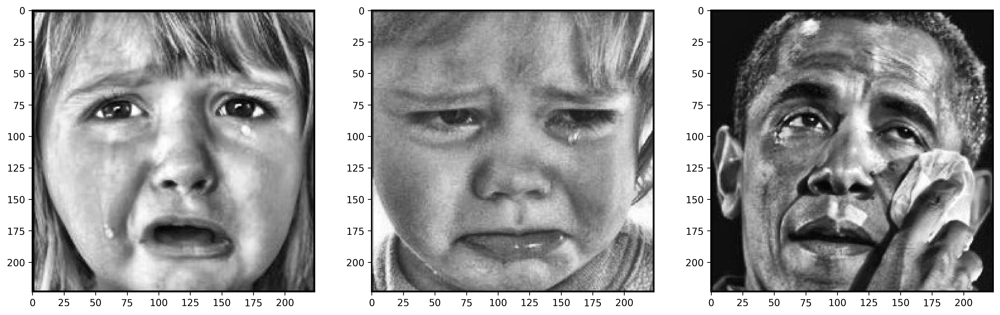

SURPRISE


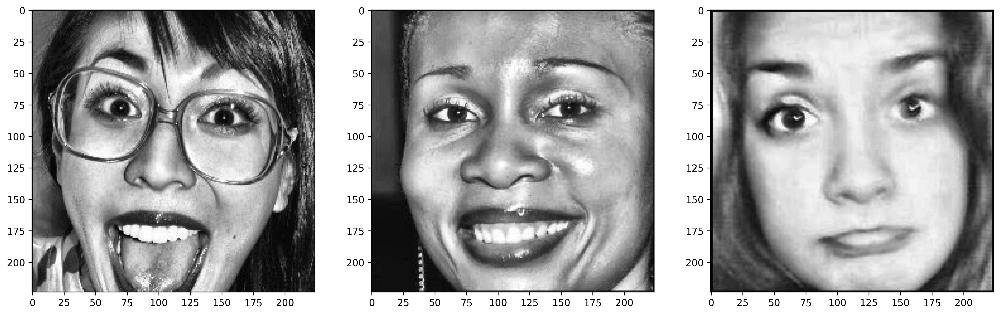

FEAR


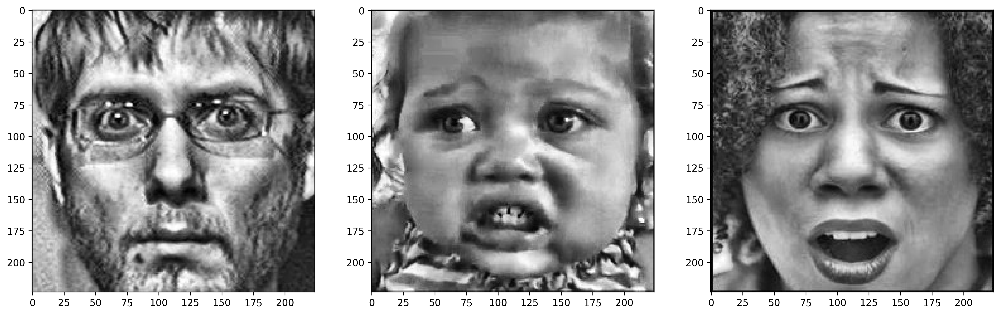

DISGUST


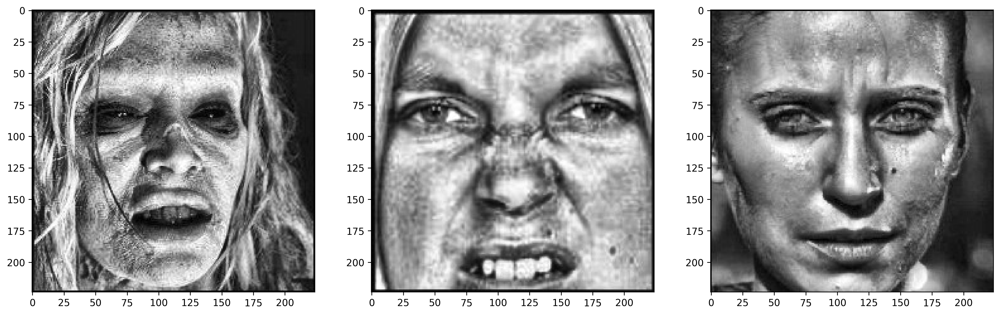

ANGER


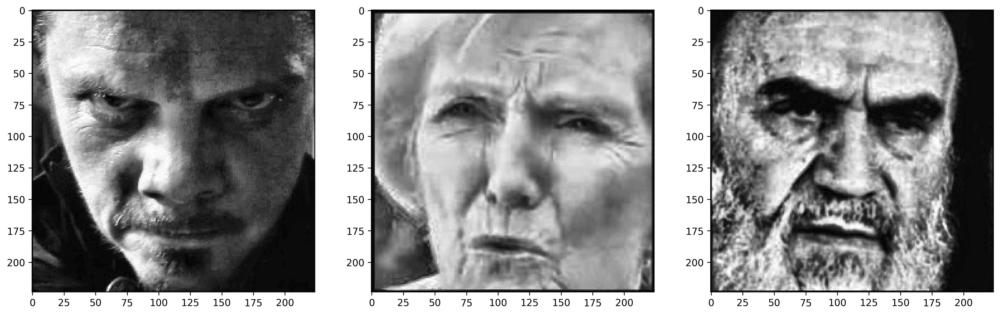

CONTEMPT


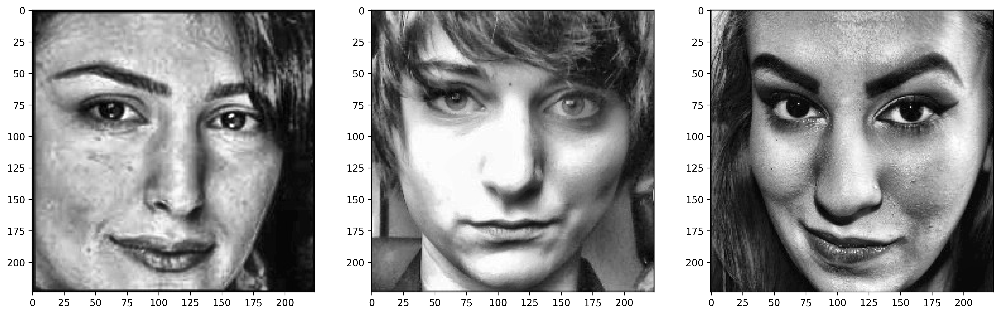

In [ ]:
for i in train_paths.keys():
    print(f'{i.upper()}')
    figure_faces, axes = plt.subplots(nrows=1,ncols=3, figsize=[18,6], dpi=300)
    axes = axes.ravel()
    image_list = os.listdir(train_paths.get(i))[:5]
    for j in range(len(axes)):
        axes[j].imshow(load_img(os.path.join(train_paths.get(i), image_list[j])))
    plt.show()

# Applying Gaussian Blur

In [ ]:
os.mkdir('train_class_Gaussian')
os.mkdir('val_class_Gaussian')

In [ ]:
emo_classes = ['neutral','happy','sad','surprise','fear','disgust','anger','contempt']
train_src = "/content/train_class_CLAHE"
train_dst = "/content/train_class_Gaussian"
val_src = "/content/val_class_CLAHE"
val_dst = "/content/val_class_Gaussian"

In [ ]:
for emotion in emo_classes:
    new_train_src = os.path.join(train_src, emotion)
    new_train_dst = os.path.join(train_dst, emotion)
    os.mkdir(f'train_class_Gaussian/{emotion}')
    for img in os.listdir(new_train_src):
        src = os.path.join(new_train_src, img)
        dst = os.path.join(new_train_dst, img)
        img = img_as_float(io.imread(src, as_gray=True))
        newimg = gaussian(img, sigma=1, mode='constant', cval=0.0)
        io.imsave(dst, newimg)
    new_val_src = os.path.join(val_src, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    os.mkdir(f'val_class_Gaussian/{emotion}') 
    for img in os.listdir(new_val_src):
        src = os.path.join(new_val_src, img)
        dst = os.path.join(new_val_dst, img)
        img = img_as_float(io.imread(src, as_gray=True))
        newimg = gaussian(img, sigma=1, mode='constant', cval=0.0)
        io.imsave(dst, newimg)

In [ ]:
#Removing useless directories
shutil.rmtree("val_class_CLAHE", ignore_errors=False, onerror=None)
shutil.rmtree("train_class_CLAHE", ignore_errors=False, onerror=None)

In [ ]:
train_paths = {}
val_paths ={}
for emotion in emo_classes:
    new_train_dst = os.path.join(train_dst, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    train_paths[emotion] = new_train_dst
    val_paths[emotion] = new_val_dst

NEUTRAL


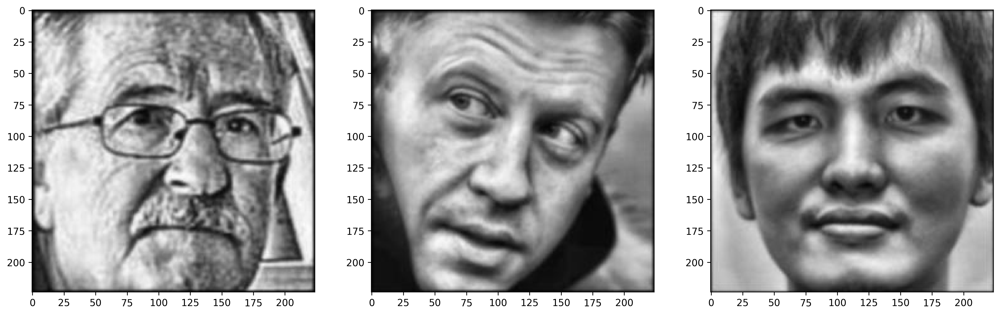

HAPPY


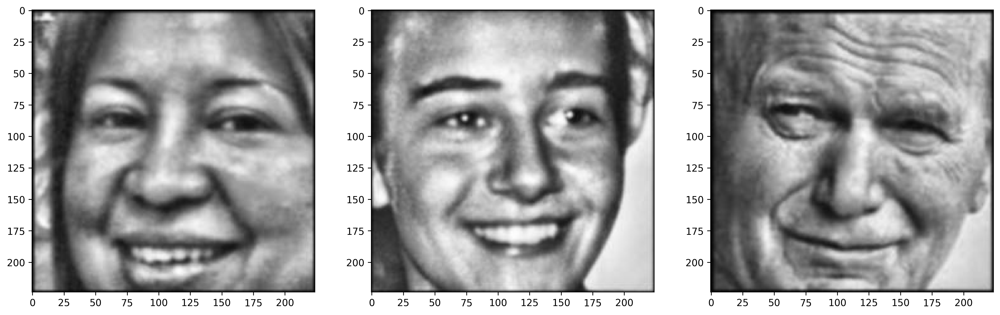

SAD


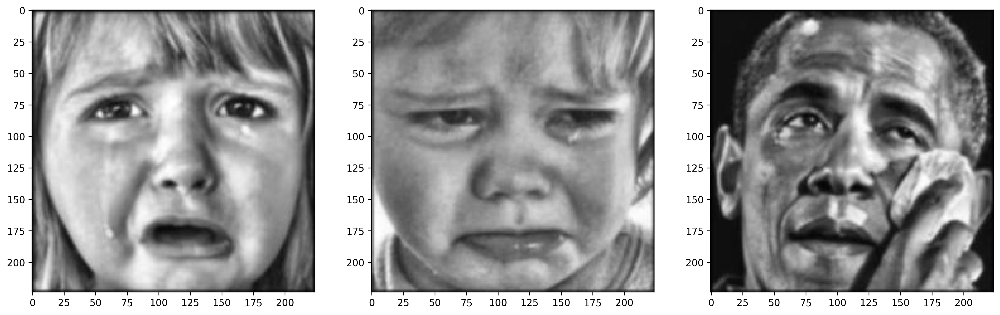

SURPRISE


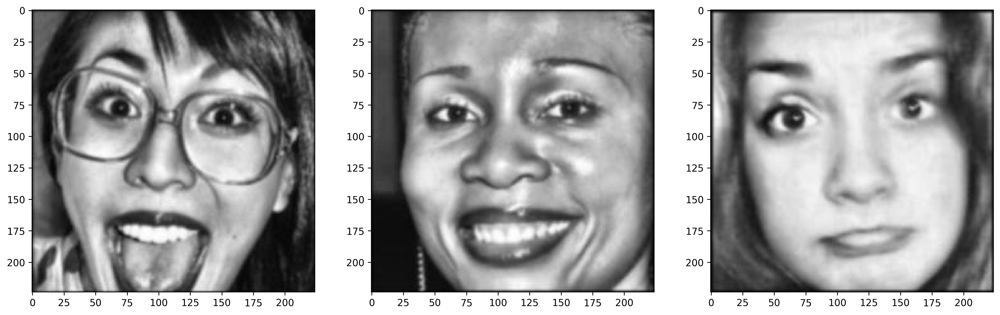

FEAR


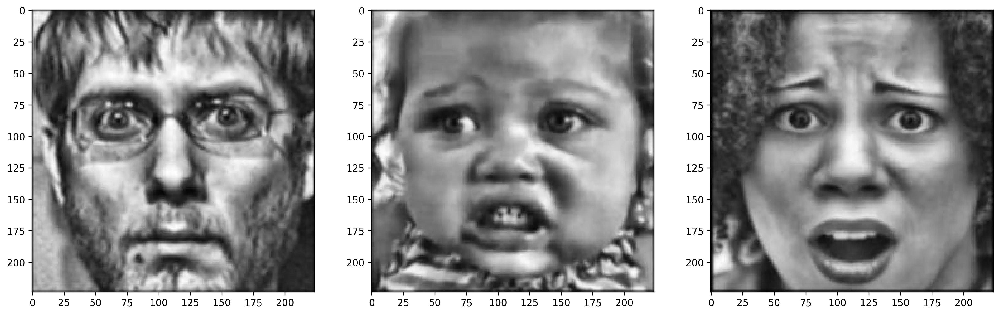

DISGUST


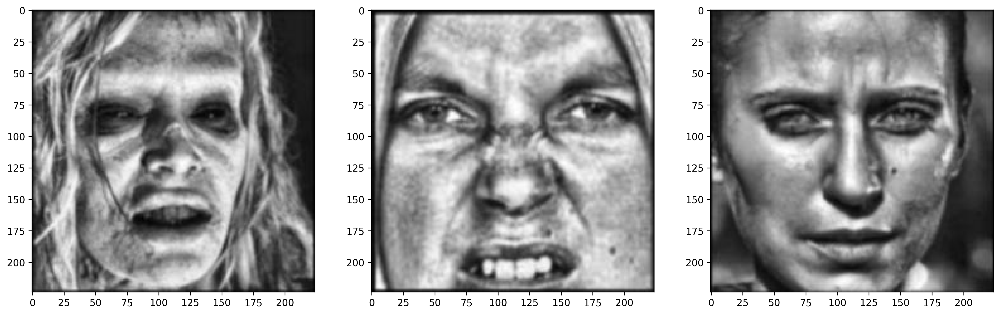

ANGER


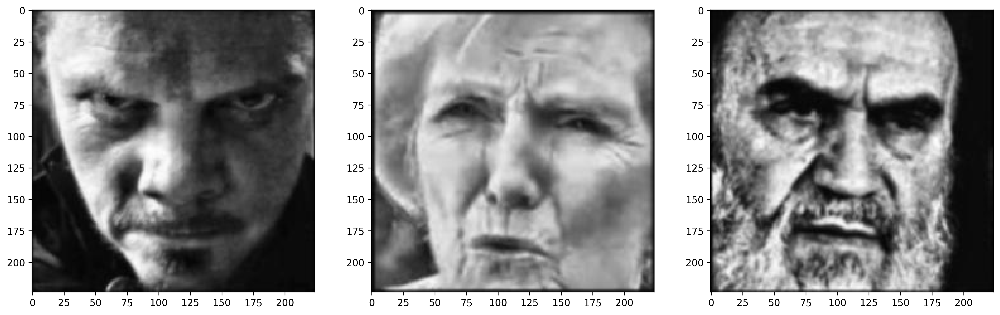

CONTEMPT


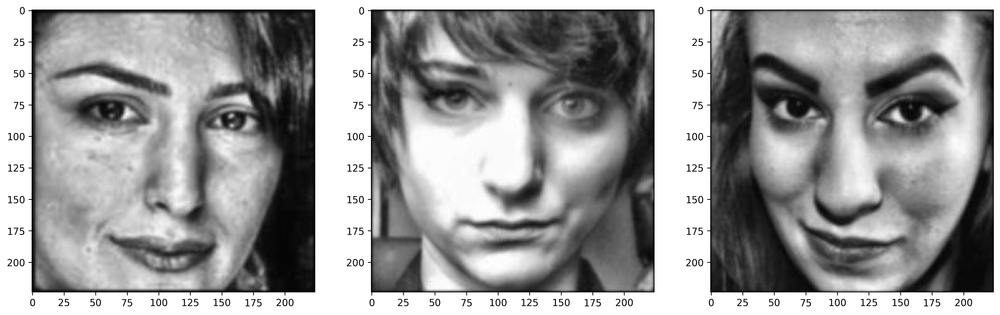

In [ ]:
for i in train_paths.keys():
    print(f'{i.upper()}')
    figure_faces, axes = plt.subplots(nrows=1,ncols=3, figsize=[18,6], dpi=300)
    axes = axes.ravel()
    image_list = os.listdir(train_paths.get(i))[:5]
    for j in range(len(axes)):
        axes[j].imshow(load_img(os.path.join(train_paths.get(i), image_list[j])))
    plt.show()

# Gamma Correction

In [ ]:
os.mkdir('train_class_Gamma')
os.mkdir('val_class_Gamma')

In [ ]:
emo_classes = ['neutral','happy','sad','surprise','fear','disgust','anger','contempt']
train_src = "/content/train_class_Gaussian"
train_dst = "/content/train_class_Gamma"
val_src = "/content/val_class_Gaussian"
val_dst = "/content/val_class_Gamma"

In [ ]:
for emotion in emo_classes:
    new_train_src = os.path.join(train_src, emotion)
    new_train_dst = os.path.join(train_dst, emotion)
    os.mkdir(f'train_class_Gamma/{emotion}')
    for img in os.listdir(new_train_src):
        src = os.path.join(new_train_src, img)
        dst = os.path.join(new_train_dst, img)
        img = cv2.imread(src, 0)
        img2 = np.power(img, 1.2)
        cv2.imwrite(dst, img2)
    new_val_src = os.path.join(val_src, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    os.mkdir(f'val_class_Gamma/{emotion}') 
    for img in os.listdir(new_val_src):
        src = os.path.join(new_val_src, img)
        dst = os.path.join(new_val_dst, img)
        img = cv2.imread(src, 0)
        img2 = np.power(img, 1.2)
        cv2.imwrite(dst, img2)

In [ ]:
train_paths = {}
val_paths ={}
for emotion in emo_classes:
    new_train_dst = os.path.join(train_dst, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    train_paths[emotion] = new_train_dst
    val_paths[emotion] = new_val_dst

NEUTRAL


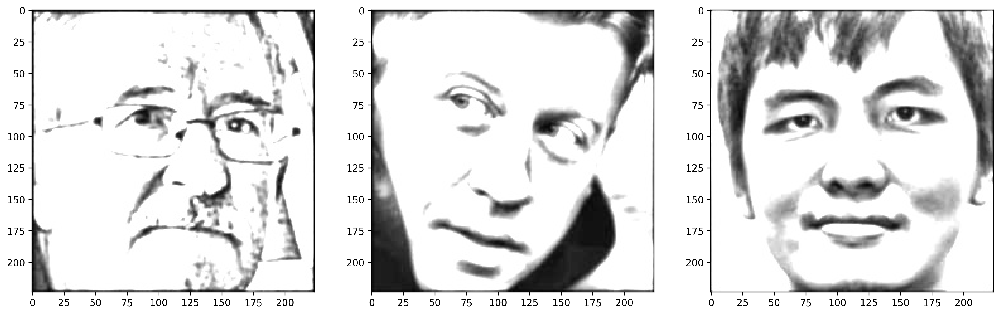

HAPPY


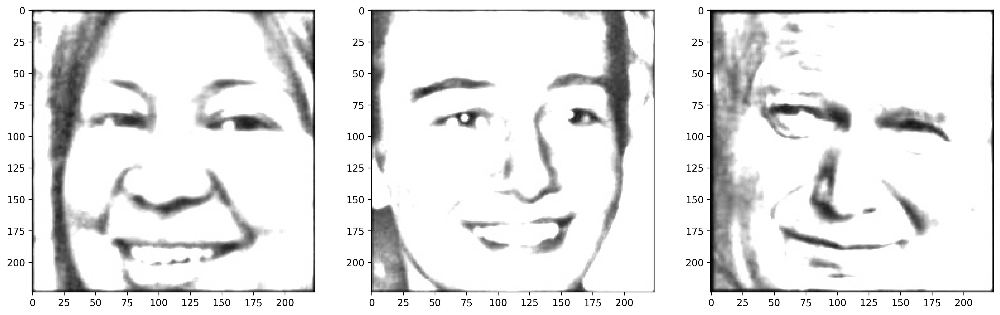

SAD


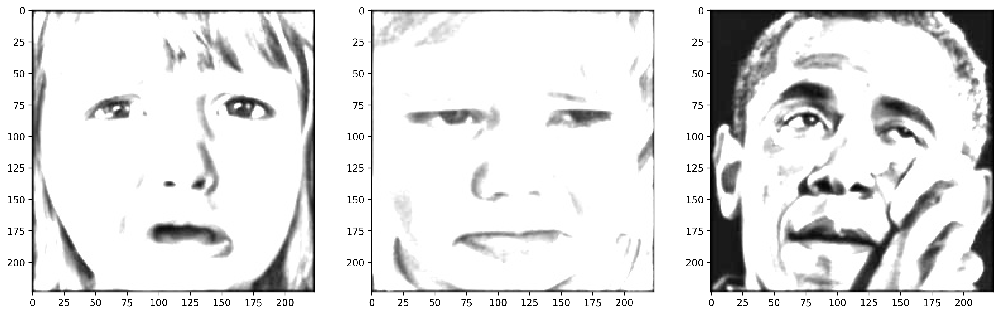

SURPRISE


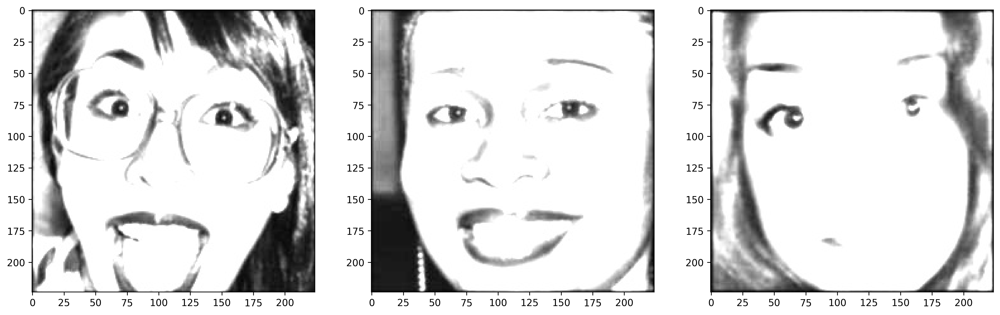

FEAR


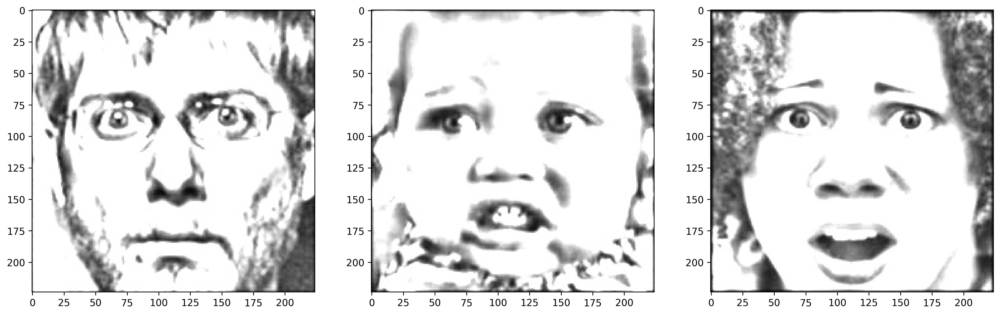

DISGUST


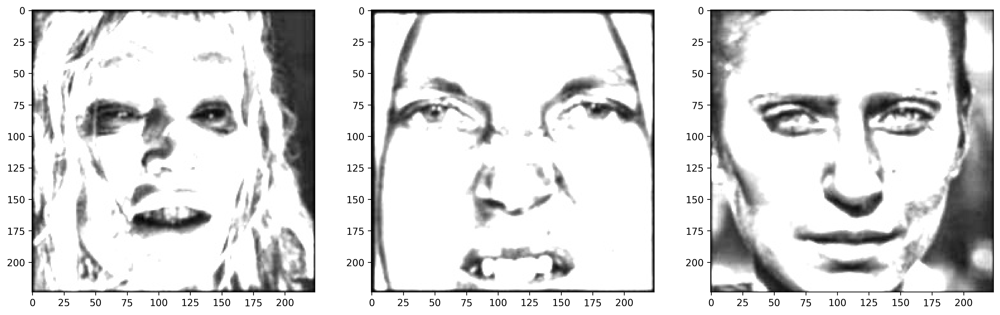

ANGER


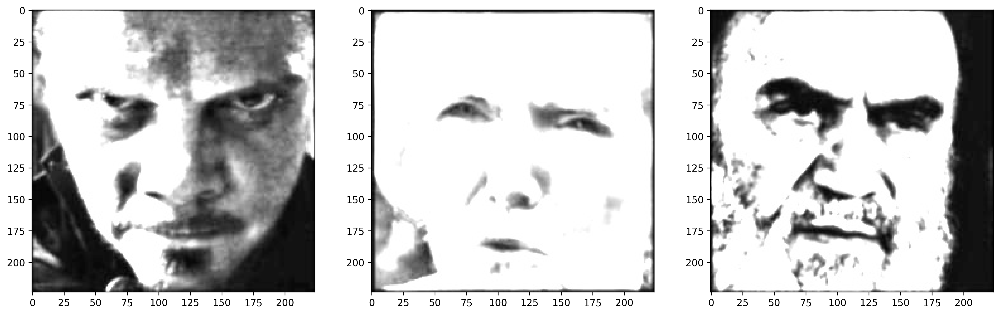

CONTEMPT


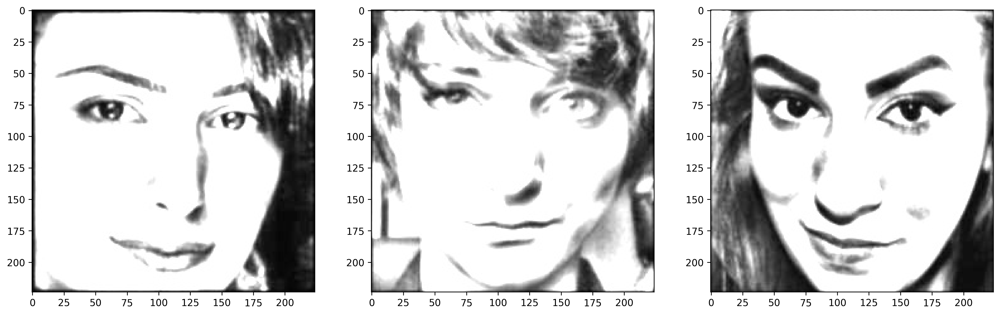

In [ ]:
for i in train_paths.keys():
    print(f'{i.upper()}')
    figure_faces, axes = plt.subplots(nrows=1,ncols=3, figsize=[18,6], dpi=300)
    axes = axes.ravel()
    image_list = os.listdir(train_paths.get(i))[:5]
    for j in range(len(axes)):
        axes[j].imshow(load_img(os.path.join(train_paths.get(i), image_list[j])))
    plt.show()

In [ ]:
#Removing useless directories
shutil.rmtree("val_class_Gaussian", ignore_errors=False, onerror=None)
shutil.rmtree("train_class_Gaussian", ignore_errors=False, onerror=None)

# Enhancing the image

In [ ]:
os.mkdir('train_class_Final')
os.mkdir('val_class_Final')

In [ ]:
emo_classes = ['neutral','happy','sad','surprise','fear','disgust','anger','contempt']
train_src = "/content/train_class_Gamma"
train_dst = "/content/train_class_Final"
val_src = "/content/val_class_Gamma"
val_dst = "/content/val_class_Final"

In [ ]:
for emotion in emo_classes:
    new_train_src = os.path.join(train_src, emotion)
    new_train_dst = os.path.join(train_dst, emotion)
    os.mkdir(f'train_class_Final/{emotion}')
    for img in os.listdir(new_train_src):
        src = os.path.join(new_train_src, img)
        dst = os.path.join(new_train_dst, img)
        img = Image.open(src)
        img_con = ImageEnhance.Contrast(img)
        img = img_con.enhance(1.9)
        Image.Image.save(img, dst)
    new_val_src = os.path.join(val_src, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    os.mkdir(f'val_class_Final/{emotion}') 
    for img in os.listdir(new_val_src):
        src = os.path.join(new_val_src, img)
        dst = os.path.join(new_val_dst, img)
        img = Image.open(src)
        img_con = ImageEnhance.Contrast(img)
        img = img_con.enhance(1.9)
        Image.Image.save(img, dst)

In [33]:
train_paths = {}
val_paths ={}
for emotion in emo_classes:
    new_train_dst = os.path.join(train_dst, emotion)
    new_val_dst = os.path.join(val_dst, emotion)
    train_paths[emotion] = new_train_dst
    val_paths[emotion] = new_val_dst

NEUTRAL


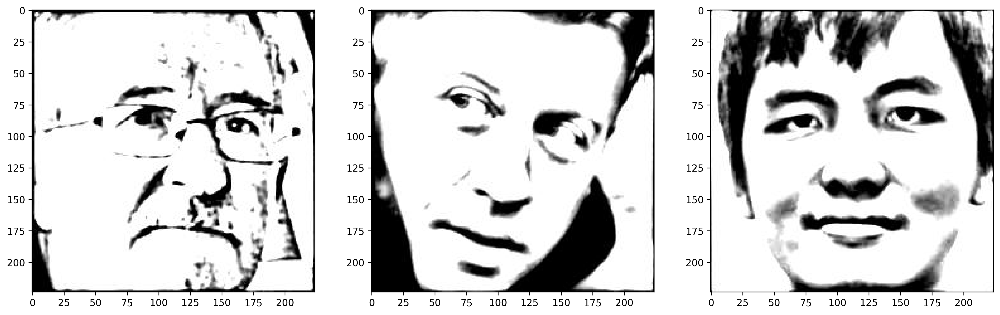

HAPPY


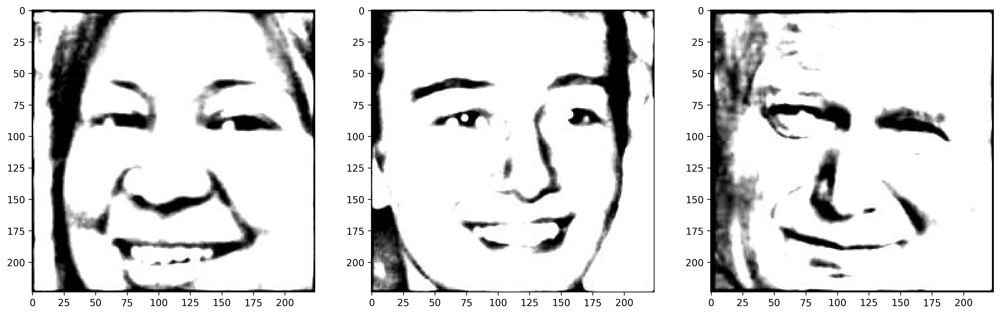

SAD


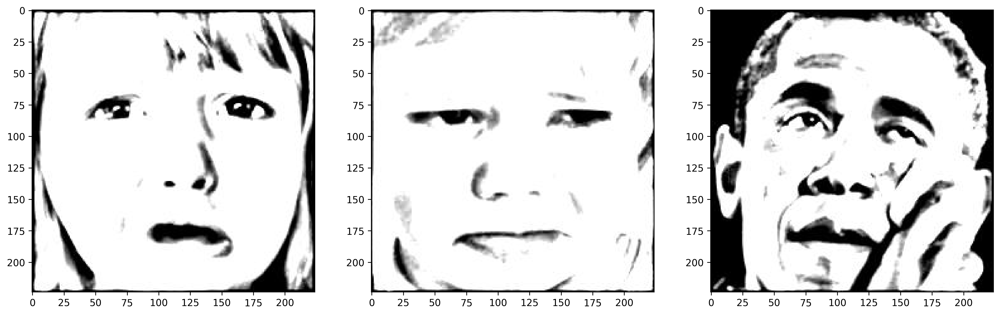

SURPRISE


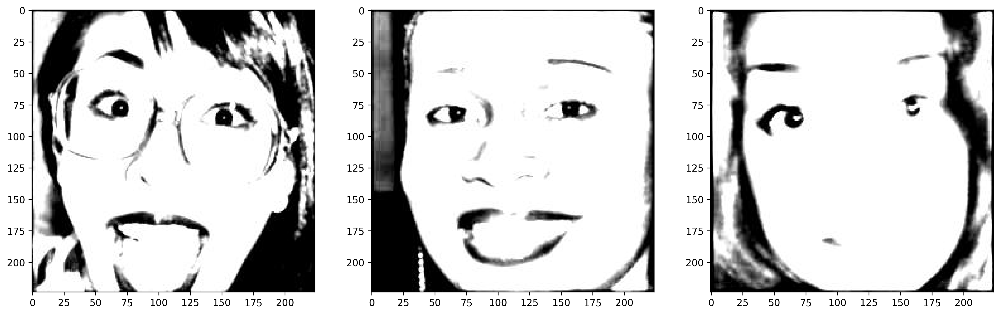

FEAR


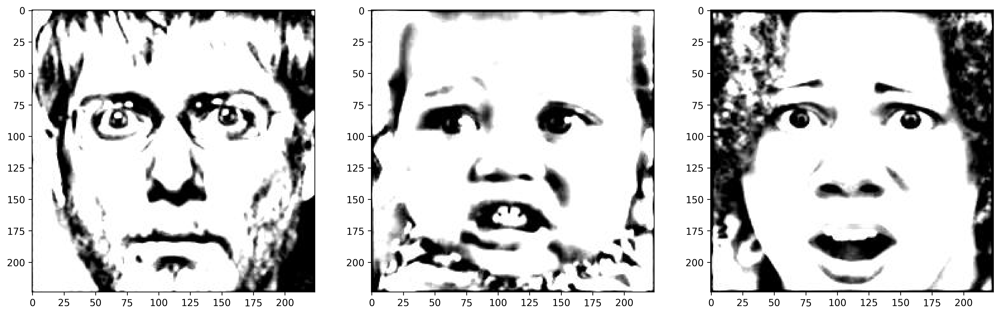

DISGUST


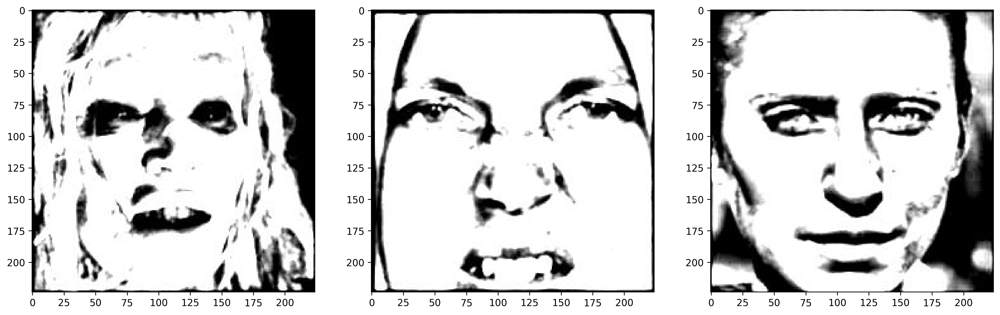

ANGER


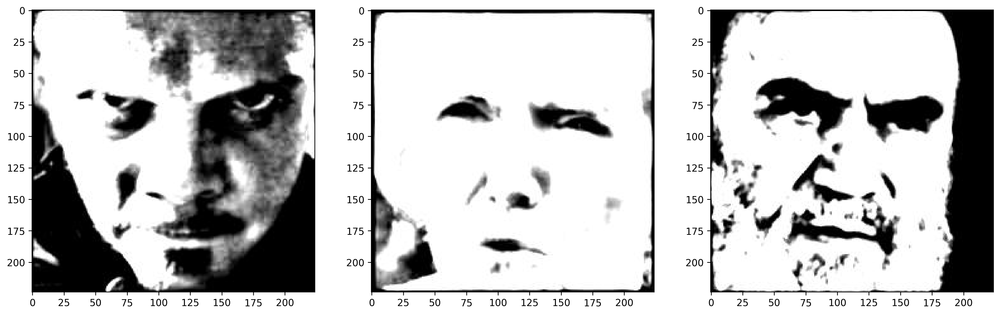

CONTEMPT


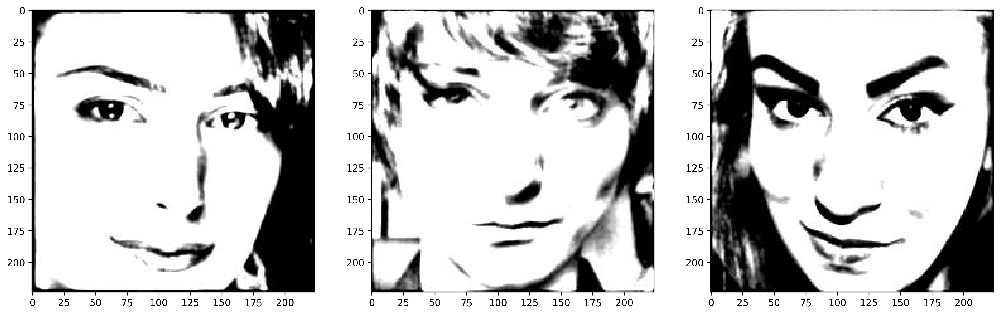

In [34]:
for i in train_paths.keys():
    print(f'{i.upper()}')
    figure_faces, axes = plt.subplots(nrows=1,ncols=3, figsize=[18,6], dpi=300)
    axes = axes.ravel()
    image_list = os.listdir(train_paths.get(i))[:5]
    for j in range(len(axes)):
        axes[j].imshow(load_img(os.path.join(train_paths.get(i), image_list[j])))
    plt.show()

In [ ]:
!zip -r train_final.zip ./train_class_Final
!zip -r val_final.zip ./val_class_Final